In [36]:
%matplotlib inline

In [41]:
import subprocess
import os
import IPython.display as ipd
import matplotlib.pyplot as plt
from scipy.io.wavfile import read, write
from scipy.signal import stft, hann, resample_poly

Use Fluidsynth and the default sound font to generate audio files

In [27]:
for i in range(1,201):
    audio_cmd = "fluidsynth -F p" + str(i) + ".wav default.sf2 p" + str(i) + ".mid -R=1"
    subprocess.call(audio_cmd, shell=True)

Use Imagemagick to convert pdf to pngs

In [3]:
for i in range(1,201):
    print("Processing p" + str(i))
    dir_cmd = "mkdir /png/p" + str(i)
    img_cmd = "convert -density 300 pdf/p" + str(i) +".pdf png/p" + str(i) + "/p" + str(i) + ".png"
    subprocess.call(dir_cmd, shell=True)
    subprocess.call(img_cmd, shell=True)

Processing p153
Processing p193


Convert audio files to 22050Hz mono

In [43]:
for i in range(1, 201):
    fs, data = read("/audio/p"+str(i)+".wav")
    data = data.sum(axis=1) / 2    # to mono
    sr = 22050   # target sample rate
    data = resample_poly(data, sr, fs)
    write("/audio_new/p"+str(i)+".wav", sr, data)

FileNotFoundError: [Errno 2] No such file or directory: '/audio/p1.wav'

Visualization and debugging

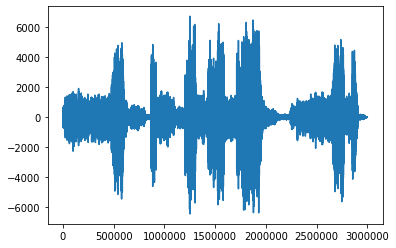

In [34]:
plt.plot(data)

In [35]:
ipd.Audio(data=data, rate=22050, autoplay=True)